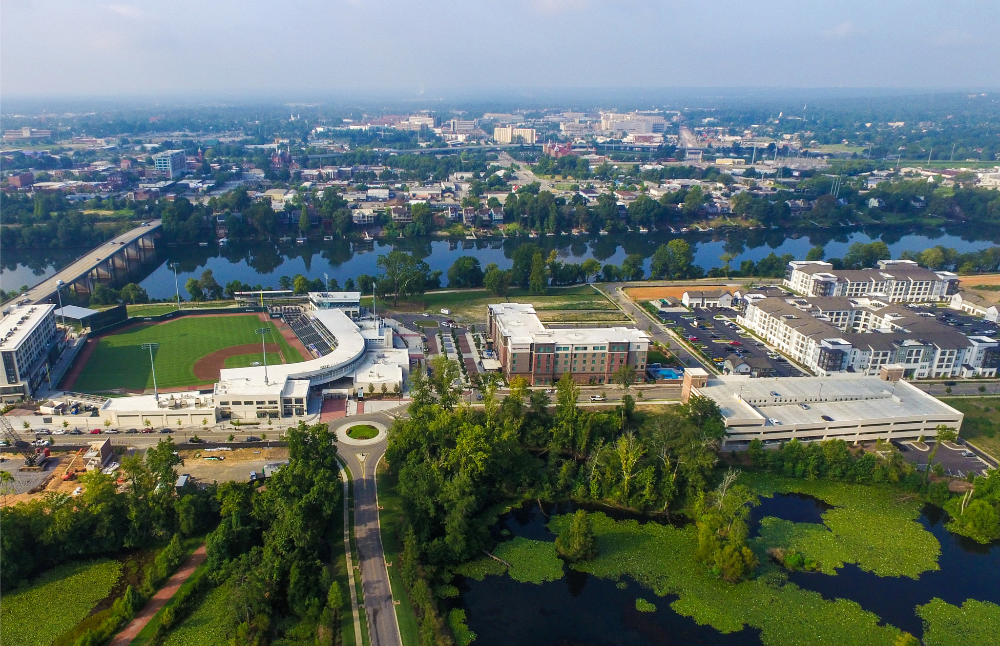

# The Battle of Neighborhoods: North Augusta

## IBM Capstone Objectives:

This project, and associated files, were produced as to meet the final objectives of Coursera's IBM Applied Data Science Capstone Certificate program. The following sections are the objectives in meeting this criteria.

Section 1: Clearly define a problem or an idea of your choice, where you would need to leverage the Foursquare location data to solve or execute. Remember that data science problems always target an audience and are meant to help a group of stakeholders solve a problem, so make sure that you explicitly describe your audience and why they would care about your problem.
This submission will eventually become your Introduction/Business Problem section in your final report. So I recommend that you push the report (having your Introduction/Business Problem section only for now) to your Github repository and submit a link to it.

Section 2: Describe the data that you will be using to solve the problem or execute your idea. Remember that you will need to use the Foursquare location data to solve the problem or execute your idea. You can absolutely use other datasets in combination with the Foursquare location data. So make sure that you provide adequate explanation and discussion, with examples, of the data that you will be using, even if it is only Foursquare location data.
This submission will eventually become your Data section in your final report. So I recommend that you push the report (having your Data section) to your Github repository and submit a link to it. 

## Section 1: Project Background

This project has been designed as someone moving to the North Augusta, SC who is interested in venues in the area.

### Analytic Purpose and Problem:
as a transplant to the North Augusta area, it's incredibly hard to learn about the culture and venues, while out of state. With this analytic, I'll have a resource

## Location:

North Augusta and surrounding areas is quickly expanding from a rural, Southern town to a town of transplant residents, many of which work in and around Fort Gordon.

For this 'Battle of the Neighborhoods' North Augusta's counties of Aiken and Edgefield will be compared. Between code segments, immediatly followin each section, I've broken down key facts about the data. At the end of this assignment, these 'facts' will be compared.

Enjoy!

## Libraries Employed:

##### Pandas: for manipulating data frames.
##### Folium: python data visualization library, used to visualize neighborhood clusters on an interactive map.
##### Scikit Learn: mathmatic library, employed for k-means clustering.
##### JSON: library to handle JSON files.
##### XML: seperates data, allowing XML data to be displayed in plain text.
##### Geocoder: retrieves locational data.
##### BeautifulSoup with Requests: library handles online request, scraping http.
##### Matplotlib: Python plotting module.
##### ArcGis: used to manage mapping.
##### FourSquareAPI: used to identify venues in the area.

### Installing/Importing Python Libraries and Dependancies

In [1]:
import numpy as np 
# vector library

import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json

!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

print('Libraries imported.')

Libraries imported.


## Section 2: Data Sources, Extraction, Cleaning

In [2]:
# DATA USED IS AN UPLOADED JSON FILE TO GITHUB
json_data = 'https://raw.githubusercontent.com/dchorrox/Coursera_Capstone/master/us_cities-coordinates.json'
json_data

'https://raw.githubusercontent.com/dchorrox/Coursera_Capstone/master/us_cities-coordinates.json'

In [3]:
df = pd.read_json(json_data, orient='columns')

In [4]:
df.head(5)

,City Name,County Code,County Name,Density,Id,Latitude,Longitude,Source,State Id,State Name,Timezone
0,Prairie Ridge,53053,Pierce,1349.8,1840037882,47.1443,-122.1408,polygon,WA,Washington,America/Los_Angeles
1,Edison,53057,Skagit,127.4,1840017314,48.5602,-122.4311,polygon,WA,Washington,America/Los_Angeles
2,Packwood,53041,Lewis,213.9,1840025265,46.6085,-121.6702,polygon,WA,Washington,America/Los_Angeles
3,Wautauga Beach,53035,Kitsap,261.7,1840037725,47.5862,-122.5482,point,WA,Washington,America/Los_Angeles
4,Harper,53035,Kitsap,342.1,1840037659,47.5207,-122.5196,point,WA,Washington,America/Los_Angeles


In [5]:
df.shape
print('The dataframe has', df.shape, 'rows and columns respectively.')

The dataframe has (36651, 11) rows and columns respectively.


In [6]:
df.rename(columns={'State Id': 'State', 'County Name':'County', 'County Code':'County_Code', 'City Name':'Neighborhood'}, inplace=True)
df.head()

,Neighborhood,County_Code,County,Density,Id,Latitude,Longitude,Source,State,State Name,Timezone
0,Prairie Ridge,53053,Pierce,1349.8,1840037882,47.1443,-122.1408,polygon,WA,Washington,America/Los_Angeles
1,Edison,53057,Skagit,127.4,1840017314,48.5602,-122.4311,polygon,WA,Washington,America/Los_Angeles
2,Packwood,53041,Lewis,213.9,1840025265,46.6085,-121.6702,polygon,WA,Washington,America/Los_Angeles
3,Wautauga Beach,53035,Kitsap,261.7,1840037725,47.5862,-122.5482,point,WA,Washington,America/Los_Angeles
4,Harper,53035,Kitsap,342.1,1840037659,47.5207,-122.5196,point,WA,Washington,America/Los_Angeles


### Sampling South Carolina

In [7]:
# Sample South Carolina Data
SC_data = df[df.State == 'SC']
SC_data.head()

,Neighborhood,County_Code,County,Density,Id,Latitude,Longitude,Source,State,State Name,Timezone
8216,Vaucluse,45003,Aiken,24.0,1840035835,33.6126,-81.8098,point,SC,South Carolina,America/New_York
8217,Eureka,45003,Aiken,51.1,1840035820,33.6940,-81.7671,point,SC,South Carolina,America/New_York
8218,Montmorenci,45003,Aiken,91.8,1840035811,33.5279,-81.6365,point,SC,South Carolina,America/New_York
8219,Bath,45003,Aiken,702.1,1840035759,33.5046,-81.8690,point,SC,South Carolina,America/New_York
8220,Millett,45005,Allendale,1.2,1840035771,33.0813,-81.5357,point,SC,South Carolina,America/New_York


In [8]:
cols = [0,2,3,5,6,8]
SC_data = SC_data[SC_data.columns[cols]]
SC_data.head().reset_index()

,index,Neighborhood,County,Density,Latitude,Longitude,State
0,8216,Vaucluse,Aiken,24.0,33.6126,-81.8098,SC
1,8217,Eureka,Aiken,51.1,33.6940,-81.7671,SC
2,8218,Montmorenci,Aiken,91.8,33.5279,-81.6365,SC
3,8219,Bath,Aiken,702.1,33.5046,-81.8690,SC
4,8220,Millett,Allendale,1.2,33.0813,-81.5357,SC


### Testing Data from known location: Municipal Building

In [9]:
address = '100 Georgia Avenue, North Augusta, SC 29841'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('North Augustas Municipal Building is located at 100 Georgia Avenue North Augusta, SC 29841; coordinates {}, {}.'.format(latitude, longitude))

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.18.1" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  app.launch_new_instance()


North Augustas Municipal Building is located at 100 Georgia Avenue North Augusta, SC 29841; coordinates 33.487984, -81.972105.


### Installing Folium to map data

In [10]:
#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
!pip install folium
import folium # map rendering library
print('Libraries imported.')

Libraries imported.


###### Test Data: South Carolina

In [11]:
# create map of South Carolina using latitude and longitude values
map = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, city, county in zip(SC_data['Latitude'], SC_data['Longitude'], SC_data['Neighborhood'], SC_data['County']):
    label = '{}, {}'.format(county, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='brown',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        ).add_to(map) 
map

In [12]:
map.save('map.html')

## Segmenting North Augusta's, Aiken and Edgefield County's

North Augusta is split between Aiken and Edgefield counties. This assignment will draw the comparison between these two counties to see where residents might want to live based on venues, neighborhoods, and their interests.

#### Gather Location for Edgefield County

In [13]:
#
edgefield_data = SC_data[SC_data.County == 'Edgefield']
edgefield_data.drop(edgefield_data.index[2], inplace=True)
print('The dataframe has', edgefield_data.shape, 'rows and columns respectively.')
edgefield_data.reset_index()

The dataframe has (4, 6) rows and columns respectively.


/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,index,Neighborhood,County,Density,Latitude,Longitude,State
0,8265,Morgana,Edgefield,13.3,33.6071,-82.0543,SC
1,16091,Murphys Estates,Edgefield,326.3,33.6002,-81.9437,SC
2,35772,Johnston,Edgefield,341.0,33.8327,-81.8051,SC
3,35773,Edgefield,Edgefield,437.0,33.7871,-81.9292,SC


In [14]:
map_edgefield = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for lat, lng, label in zip(edgefield_data['Latitude'], edgefield_data['Longitude'], edgefield_data['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=15,
        popup=label,
        color='brown',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_edgefield)  
    
map_edgefield

#### Gather location for Aiken County 

In [15]:
aiken_data = SC_data[SC_data.County == 'Aiken']
aiken_data.drop(aiken_data.index[2], inplace=True)
print('The dataframe has', aiken_data.shape, 'rows and columns respectively.')
aiken_data.reset_index()

The dataframe has (19, 6) rows and columns respectively.


,index,Neighborhood,County,Density,Latitude,Longitude,State
0,8216,Vaucluse,Aiken,24.0,33.6126,-81.8098,SC
1,8217,Eureka,Aiken,51.1,33.6940,-81.7671,SC
2,8219,Bath,Aiken,702.1,33.5046,-81.8690,SC
3,16065,Langley,Aiken,263.3,33.5121,-81.8343,SC
4,16066,Gloverville,Aiken,457.1,33.5274,-81.8145,SC
5,16067,Clearwater,Aiken,614.1,33.5038,-81.9100,SC
6,16068,Warrenville,Aiken,646.7,33.5461,-81.7990,SC
7,16069,Graniteville,Aiken,685.2,33.5646,-81.8079,SC
8,16070,Belvedere,Aiken,717.8,33.5369,-81.9424,SC
9,35672,Windsor,Aiken,71.0,33.4812,-81.5129,SC


In [16]:
map_aiken = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for lat, lng, label in zip(aiken_data['Latitude'], aiken_data['Longitude'], aiken_data['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=15,
        popup=label,
        color='brown',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_aiken)  
    
map_aiken

### Finding: North Augusta Neighborhood Differences

These counties are split by a different number of neighborhoods.

###### Edgefield = 4 Neighborhoods
###### Aiken = 19 Neighborhoods

#### Hypothesis: North Augusta's neighborhoods likely differ vastly because they're divided into different neighborhoods, likely suggesting one is larger in population or size.

## Using FourSquare, Analyze North Augusta Counties

### FourSquare Client ID and Secret

In [17]:
CLIENT_ID = ('F0UVEPL1QURPOE4MJXO0NBJGFVY3L1B23DMIP2WCRPD0WXL0')
CLIENT_SECRET = ('OGTJLNKJBUCJNLEAU10RFO5PXID1USKR1PAU2FILWSQ5VAVC')
VERSION = 20180604
print("Your credentails")
print('CLIENT ID: ' + CLIENT_ID)
print('CLIENT_SECRET: ' + CLIENT_SECRET)

Your credentails
CLIENT ID: F0UVEPL1QURPOE4MJXO0NBJGFVY3L1B23DMIP2WCRPD0WXL0
CLIENT_SECRET: OGTJLNKJBUCJNLEAU10RFO5PXID1USKR1PAU2FILWSQ5VAVC


### Center FourSquare Search from North Augusta Municipal Center 
Sampled at 10 miles

In [18]:
address = '100 Georgia Avenue, North Augusta, SC 29841'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('North Augustas Municipal Building is located at 100 Georgia Avenue North Augusta, SC 29841; coordinates {}, {}.'.format(latitude, longitude))

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.18.1" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  app.launch_new_instance()


North Augustas Municipal Building is located at 100 Georgia Avenue North Augusta, SC 29841; coordinates 33.487984, -81.972105.


In [19]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 16093.4 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=F0UVEPL1QURPOE4MJXO0NBJGFVY3L1B23DMIP2WCRPD0WXL0&client_secret=OGTJLNKJBUCJNLEAU10RFO5PXID1USKR1PAU2FILWSQ5VAVC&v=20180604&ll=33.487984,-81.972105&radius=16093.4&limit=100'

#### North Augusta FourSquare Venues Categorized

In [20]:
results = requests.get(url).json()

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))
nearby_venues.head()


100 venues were returned by Foursquare.


,name,categories,lat,lng
0,Mellow Mushroom,Pizza Place,33.477980,-81.972394
1,Riverwalk,Trail,33.477193,-81.962732
2,Solé,Japanese Restaurant,33.477218,-81.970640
3,Augusta Market at the River,Plaza,33.477268,-81.964378
4,New Moon Cafe,Café,33.476212,-81.968576


### Exploring Edgefield (at 10 miles)

In [21]:
address = 'Edgefield, SC'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geographic coordinates of Edgefield County are {}, {}.'.format(latitude, longitude))

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.18.1" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  app.launch_new_instance()


The geographic coordinates of Edgefield County are 33.7635851, -81.9759066.


In [22]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 16093.4 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=F0UVEPL1QURPOE4MJXO0NBJGFVY3L1B23DMIP2WCRPD0WXL0&client_secret=OGTJLNKJBUCJNLEAU10RFO5PXID1USKR1PAU2FILWSQ5VAVC&v=20180604&ll=33.7635851,-81.9759066&radius=16093.4&limit=100'

#### Edgefield FourSquare Venues Categorized

In [23]:
results = requests.get(url).json()

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))
nearby_venues.head()

16 venues were returned by Foursquare.


,name,categories,lat,lng
0,Sara's Fruit and Vegetable Stand,Farmers Market,33.720944,-81.855516
1,Cook's Farm Stand,Farmers Market,33.745639,-81.871843
2,Dollar General,Discount Store,33.773708,-81.916580
3,CVS pharmacy,Pharmacy,33.797609,-81.891068
4,Dollar General,Discount Store,33.737821,-81.854507


### Exploring Aiken (at 10 miles)

In [24]:
address = 'Aiken, SC'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Aiken, SC are {}, {}.'.format(latitude, longitude))

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.18.1" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  app.launch_new_instance()


The geograpical coordinate of Aiken, SC are 33.5598586, -81.721952.


In [25]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 16093.4 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=F0UVEPL1QURPOE4MJXO0NBJGFVY3L1B23DMIP2WCRPD0WXL0&client_secret=OGTJLNKJBUCJNLEAU10RFO5PXID1USKR1PAU2FILWSQ5VAVC&v=20180604&ll=33.5598586,-81.721952&radius=16093.4&limit=100'

#### Aiken FourSquare Venues Categorized

In [26]:
results = requests.get(url).json()

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))
nearby_venues.head()

100 venues were returned by Foursquare.


,name,categories,lat,lng
0,New Moon Cafe,Café,33.562184,-81.721923
1,Mellow Mushroom,Pizza Place,33.559652,-81.722350
2,Hopeland Gardens,Garden,33.548682,-81.723429
3,Betsy's On The Corner,Diner,33.563374,-81.721822
4,The Pizza Joint,Pizza Place,33.560580,-81.720481


### Finding: Comparison of North Augusta Venues by County

The results of North Augusta and counties provides a comparison between the city of North Augusta and counties of Aiken and Edgefield. Based on these results, here are findings throughout the area.

##### North Augusta: our control, we know this is a city, and that the top five venues include:
1x Pizza Place, 1x Trail, 1x Japanese Restaurant, 1x Plaza, 1x Cafe

##### Edgefield: compared to North Augusta, Edgefield's top five venues include:
2x Farmers Markets, 1x Pharmacy, 2x Discount Stores

##### Aiken: compared to North Augusta, Aiken's top five venues include: 
1x Cafe, 2x Pizza Place, 1x Garden. 1x Diner

## Neighborhoods and Venues Comparison of North Augusta Counties, Aiken, and Edgefield 

### Exploring Edgefield Neighborhoods and Venues

In [27]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    edgefield_venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        edgefield_venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    edgefield_nearby_venues = pd.DataFrame([item for edgefield_venue_list in edgefield_venues_list for item in edgefield_venue_list])
    edgefield_nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(edgefield_nearby_venues)

edgefield_venues = getNearbyVenues(names=edgefield_data['Neighborhood'],
                                   latitudes=edgefield_data['Latitude'],
                                   longitudes=edgefield_data['Longitude']
                                  )

Morgana
Murphys Estates
Johnston
Edgefield


In [28]:
print('There are', edgefield_venues.shape, 'rows and columns venues and neighborhoods in the Edgefield County.')
edgefield_venues.head(12)

There are (9, 7) rows and columns venues and neighborhoods in the Edgefield County.


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Johnston,33.8327,-81.8051,Shell,33.831662,-81.800618,Gas Station
1,Johnston,33.8327,-81.8051,Riley's restaurant,33.831521,-81.801469,American Restaurant
2,Johnston,33.8327,-81.8051,Los Tapitos,33.832424,-81.801154,Mexican Restaurant
3,Johnston,33.8327,-81.8051,the chicken place,33.831050,-81.800911,American Restaurant
4,Johnston,33.8327,-81.8051,Taqueria Los Rieles,33.830956,-81.800735,Mexican Restaurant
5,Edgefield,33.7871,-81.9292,Iron Mountain,33.788228,-81.927650,Business Service
6,Edgefield,33.7871,-81.9292,Park Row Market,33.789311,-81.928984,American Restaurant
7,Edgefield,33.7871,-81.9292,Pool Hall,33.789437,-81.930163,Burger Joint
8,Edgefield,33.7871,-81.9292,Turkey Shoppe on Main,33.789635,-81.928810,Sporting Goods Shop


##### Edgefield Neighborhood Comparison

In [29]:
plot1=edgefield_venues["Neighborhood"].value_counts().plot(kind = "bar")
plot1.set_xlabel('Neighborhood')
plot1.set_ylabel('Venue Count')

Text(0, 0.5, 'Venue Count')

##### Edgefield Neighborhood Venues

In [30]:
edgefield_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Edgefield,4,4,4,4,4,4
Johnston,5,5,5,5,5,5


In [31]:
print('There are {} uniques categories.'.format(len(edgefield_venues['Venue Category'].unique())))

There are 6 uniques categories.


In [32]:
# one hot encoding
edgefield_onehot = pd.get_dummies(edgefield_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
edgefield_onehot['Neighborhood'] = edgefield_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [edgefield_onehot.columns[-1]] + list(edgefield_onehot.columns[:-1])
edgefield_onehot = edgefield_onehot[fixed_columns]

edgefield_onehot.head()

,Neighborhood,American Restaurant,Burger Joint,Business Service,Gas Station,Mexican Restaurant,Sporting Goods Shop
0,Johnston,0,0,0,1,0,0
1,Johnston,1,0,0,0,0,0
2,Johnston,0,0,0,0,1,0
3,Johnston,1,0,0,0,0,0
4,Johnston,0,0,0,0,1,0


In [33]:
edgefield_onehot.shape
print('The dataframe has', edgefield_onehot.shape, 'rows and columns respectively.')

The dataframe has (9, 7) rows and columns respectively.


In [34]:
edgefield_grouped = edgefield_onehot.groupby('Neighborhood').mean().reset_index()
edgefield_grouped

,Neighborhood,American Restaurant,Burger Joint,Business Service,Gas Station,Mexican Restaurant,Sporting Goods Shop
0,Edgefield,0.25,0.25,0.25,0.0,0.0,0.25
1,Johnston,0.40,0.00,0.00,0.2,0.4,0.00


##### Edgefield Neighborhoods with Top 10 venues

In [35]:
num_top_venues = 10

for hood in edgefield_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = edgefield_grouped[edgefield_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Edgefield----
                 venue  freq
0  American Restaurant  0.25
1         Burger Joint  0.25
2     Business Service  0.25
3  Sporting Goods Shop  0.25
4          Gas Station  0.00
5   Mexican Restaurant  0.00


----Johnston----
                 venue  freq
0  American Restaurant   0.4
1   Mexican Restaurant   0.4
2          Gas Station   0.2
3         Burger Joint   0.0
4     Business Service   0.0
5  Sporting Goods Shop   0.0




In [36]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]


num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
edgefield_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
edgefield_neighborhoods_venues_sorted['Neighborhood'] = edgefield_grouped['Neighborhood']

for ind in np.arange(edgefield_grouped.shape[0]):
    edgefield_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(edgefield_grouped.iloc[ind, :], num_top_venues)

edgefield_neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Edgefield,Sporting Goods Shop,Business Service,Burger Joint,American Restaurant,Mexican Restaurant
1,Johnston,Mexican Restaurant,American Restaurant,Gas Station,Sporting Goods Shop,Business Service


In [37]:
edgefield_neighborhoods_venues_sorted.shape
print('The dataframe has', edgefield_neighborhoods_venues_sorted.shape, 'rows and columns respectively.')

The dataframe has (2, 6) rows and columns respectively.


### Exploring Aiken Neighborhoods and Venues

In [38]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    aiken_nearby_venues = pd.DataFrame([item for venues_list in venues_list for item in venues_list])
    aiken_nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(aiken_nearby_venues)

aiken_venues = getNearbyVenues(names=aiken_data['Neighborhood'],
                                   latitudes=aiken_data['Latitude'],
                                   longitudes=aiken_data['Longitude']
                                  )

Vaucluse
Eureka
Bath
Langley
Gloverville
Clearwater
Warrenville
Graniteville
Belvedere
Windsor
Monetta
Perry
Salley
Wagener
Jackson
New Ellenton
Burnettown
North Augusta
Aiken


In [39]:
print('There are', aiken_venues.shape, 'rows and columns venues and neighborhoods in Aiken County.')
aiken_venues.head(10)

There are (50, 7) rows and columns venues and neighborhoods in Aiken County.


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Vaucluse,33.6126,-81.8098,United States Postal Service,33.612982,-81.804797,Post Office
1,Vaucluse,33.6126,-81.8098,Sage Valley Gun Club,33.615263,-81.812716,Hunting Supply
2,Bath,33.5046,-81.8690,Ming Ming Chinese Restaurant,33.506251,-81.865781,Chinese Restaurant
3,Bath,33.5046,-81.8690,BP,33.506049,-81.865109,Gas Station
4,Clearwater,33.5038,-81.9100,Mi Rancho,33.500686,-81.906795,Mexican Restaurant
5,Clearwater,33.5038,-81.9100,The Helm,33.500172,-81.906888,Bar
6,Graniteville,33.5646,-81.8079,Blue Top Grill,33.561214,-81.805437,American Restaurant
7,Graniteville,33.5646,-81.8079,Dollar General,33.564087,-81.806541,Discount Store
8,Graniteville,33.5646,-81.8079,Jade Garden,33.564600,-81.806963,Chinese Restaurant
9,Graniteville,33.5646,-81.8079,Da Creek,33.564754,-81.812132,Beach


Text(0, 0.5, 'Venue Count')

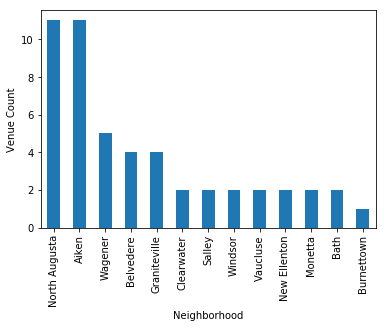

In [40]:
plot1=aiken_venues['Neighborhood'].value_counts().plot(kind = "bar")
plot1.set_xlabel('Neighborhood')
plot1.set_ylabel('Venue Count')

In [41]:
venue_counts = aiken_venues.groupby('Neighborhood').count()
venue_counts

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Aiken,11,11,11,11,11,11
Bath,2,2,2,2,2,2
Belvedere,4,4,4,4,4,4
Burnettown,1,1,1,1,1,1
Clearwater,2,2,2,2,2,2
Graniteville,4,4,4,4,4,4
Monetta,2,2,2,2,2,2
New Ellenton,2,2,2,2,2,2
North Augusta,11,11,11,11,11,11


In [42]:
print('There are {} uniques categories.'.format(len(aiken_venues['Venue Category'].unique())))
aiken_venues.groupby('Neighborhood').count()

There are 31 uniques categories.


,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Aiken,11,11,11,11,11,11
Bath,2,2,2,2,2,2
Belvedere,4,4,4,4,4,4
Burnettown,1,1,1,1,1,1
Clearwater,2,2,2,2,2,2
Graniteville,4,4,4,4,4,4
Monetta,2,2,2,2,2,2
New Ellenton,2,2,2,2,2,2
North Augusta,11,11,11,11,11,11


In [43]:
# one hot encoding
aiken_onehot = pd.get_dummies(aiken_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
aiken_onehot['Neighborhood'] = aiken_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [aiken_onehot.columns[-1]] + list(aiken_onehot.columns[:-1])
aiken_onehot = aiken_onehot[fixed_columns]

aiken_onehot.shape
print('The dataframe has', aiken_onehot.shape, 'rows and columns respectively.')

aiken_onehot.head()

The dataframe has (50, 32) rows and columns respectively.


,Neighborhood,American Restaurant,Arts & Crafts Store,Auto Garage,BBQ Joint,Bar,Beach,Business Service,Café,Chinese Restaurant,Convenience Store,Deli / Bodega,Diner,Discount Store,Fast Food Restaurant,Fried Chicken Joint,Gas Station,Gift Shop,Grocery Store,Hunting Supply,Liquor Store,Locksmith,Massage Studio,Mexican Restaurant,Pharmacy,Pizza Place,Pool Hall,Post Office,Scenic Lookout,Seafood Restaurant,Thai Restaurant,Thrift / Vintage Store
0,Vaucluse,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,Vaucluse,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,Bath,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Bath,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Clearwater,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [44]:
aiken_grouped = aiken_onehot.groupby('Neighborhood').mean().reset_index()
aiken_grouped

,Neighborhood,American Restaurant,Arts & Crafts Store,Auto Garage,BBQ Joint,Bar,Beach,Business Service,Café,Chinese Restaurant,Convenience Store,Deli / Bodega,Diner,Discount Store,Fast Food Restaurant,Fried Chicken Joint,Gas Station,Gift Shop,Grocery Store,Hunting Supply,Liquor Store,Locksmith,Massage Studio,Mexican Restaurant,Pharmacy,Pizza Place,Pool Hall,Post Office,Scenic Lookout,Seafood Restaurant,Thai Restaurant,Thrift / Vintage Store
0,Aiken,0.00,0.000000,0.00,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.090909,0.0,0.090909,0.000000,0.0,0.090909,0.00,0.000000,0.00,0.090909,0.00,0.000000,0.090909,0.000000,0.272727,0.090909,0.0,0.0,0.000000,0.090909,0.090909
1,Bath,0.00,0.000000,0.00,0.0,0.0,0.00,0.0,0.0,0.500000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.500000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
2,Belvedere,0.00,0.000000,0.25,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.25,0.000000,0.25,0.000000,0.25,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
3,Burnettown,0.00,0.000000,0.00,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.000000,0.000000,0.000000
4,Clearwater,0.00,0.000000,0.00,0.0,0.5,0.00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.500000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
5,Graniteville,0.25,0.000000,0.00,0.0,0.0,0.25,0.0,0.0,0.250000,0.0,0.000000,0.0,0.250000,0.000000,0.0,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
6,Monetta,0.00,0.000000,0.00,0.0,0.0,0.00,0.0,0.5,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.5,0.0,0.000000,0.000000,0.000000
7,New Ellenton,0.00,0.000000,0.00,0.5,0.0,0.00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.5,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
8,North Augusta,0.00,0.090909,0.00,0.0,0.0,0.00,0.0,0.0,0.090909,0.0,0.000000,0.0,0.090909,0.181818,0.0,0.000000,0.00,0.090909,0.00,0.000000,0.00,0.090909,0.000000,0.090909,0.090909,0.000000,0.0,0.0,0.090909,0.000000,0.090909
9,Salley,0.00,0.000000,0.00,0.0,0.0,0.00,0.5,0.0,0.000000,0.0,0.000000,0.5,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000


##### Top 10 Aiken Neighborhood Venues

In [45]:
num_top_venues = 10

for hood in aiken_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = aiken_grouped[aiken_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Aiken----
                    venue  freq
0             Pizza Place  0.27
1             Gas Station  0.09
2           Deli / Bodega  0.09
3         Thai Restaurant  0.09
4               Pool Hall  0.09
5      Mexican Restaurant  0.09
6            Liquor Store  0.09
7          Discount Store  0.09
8  Thrift / Vintage Store  0.09
9       Convenience Store  0.00


----Bath----
                venue  freq
0         Gas Station   0.5
1  Chinese Restaurant   0.5
2           Gift Shop   0.0
3     Thai Restaurant   0.0
4  Seafood Restaurant   0.0
5      Scenic Lookout   0.0
6         Post Office   0.0
7           Pool Hall   0.0
8         Pizza Place   0.0
9            Pharmacy   0.0


----Belvedere----
                 venue  freq
0            Gift Shop  0.25
1          Auto Garage  0.25
2            Locksmith  0.25
3       Hunting Supply  0.25
4  American Restaurant  0.00
5      Thai Restaurant  0.00
6   Seafood Restaurant  0.00
7       Scenic Lookout  0.00
8          Post Office  0.00
9

In [46]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]


num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
aiken_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
aiken_neighborhoods_venues_sorted['Neighborhood'] = aiken_grouped['Neighborhood']

for ind in np.arange(aiken_grouped.shape[0]):
    aiken_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(aiken_grouped.iloc[ind, :], num_top_venues)

aiken_neighborhoods_venues_sorted.shape
print('The dataframe has', aiken_neighborhoods_venues_sorted.shape, 'rows and columns respectively.')
aiken_neighborhoods_venues_sorted

The dataframe has (13, 6) rows and columns respectively.


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Aiken,Pizza Place,Thrift / Vintage Store,Mexican Restaurant,Deli / Bodega,Discount Store
1,Bath,Gas Station,Chinese Restaurant,Fried Chicken Joint,Arts & Crafts Store,Auto Garage
2,Belvedere,Auto Garage,Gift Shop,Hunting Supply,Locksmith,Thrift / Vintage Store
3,Burnettown,Scenic Lookout,Thrift / Vintage Store,Fried Chicken Joint,Arts & Crafts Store,Auto Garage
4,Clearwater,Bar,Mexican Restaurant,Thrift / Vintage Store,Fried Chicken Joint,Arts & Crafts Store
5,Graniteville,American Restaurant,Beach,Chinese Restaurant,Discount Store,Fried Chicken Joint
6,Monetta,Post Office,Café,Thrift / Vintage Store,Fried Chicken Joint,Arts & Crafts Store
7,New Ellenton,Fried Chicken Joint,BBQ Joint,Thrift / Vintage Store,Arts & Crafts Store,Auto Garage
8,North Augusta,Fast Food Restaurant,Thrift / Vintage Store,Pizza Place,Chinese Restaurant,Grocery Store
9,Salley,Business Service,Diner,Thrift / Vintage Store,Fried Chicken Joint,Arts & Crafts Store


### Finding: Neighborhood Venues Compared Across  Aiken and Edgefield
#### Edgefield is comprised of two neighborhoods, each with simiar venues:
##### Hypothesis: both Edgefield and Johnston neighborhoods have a smilar culture based on their consumer habbits at Restaurants and Sporting Goods Shops; likely suburb or rural area.
###### Neighborhood Edgefield, Edgefield:
1x American Restaurant, 1x Sporting Goods Shop, 1x Southern/Soul Food Restaurant, 1x Furniture/ Home Store, 1x Burger Joint
###### Neighborhood Edgefield, Johnston:
1x Mexican Restaurant, 1x American Restaurant, 1x Gas Station, 1x Sporting Goods Shop, 1x Southern/ Soul Food Restaurant
#### Aiken is comprised of 14 neighborhoods, each with varying venuses:
##### Hypothesis: Aiken is a large county and is composed of microcultures throughout urban, suburban, and rural areas.
###### Neighborhood Aiken, Aiken: 
1x Pizza Place, 1x Thrift/Vintage Store, 1x Discount Store, 1x Gas Station, 1x Thai Restaurant
###### Neighborhood Aiken, Bath: 
1x Snack Place, 1x Gas Station, 1x Chinese Restaurant, 1x Thrift/Vintage Store, 1x Convenience Store
###### Neighborhood Aiken, Belvedere: 
1x Gift Shop, 1x Locksmith, 1x Hunting Supply, 1x Office, 1x Auto-Garage
###### Neighborhood Aiken, Clearwater:
1x Bar, 1x Mexican Restaurant, 1x Thrift/Vintage Store, 1x Convenience Store, 1x Financial or Legal Service
###### Neighborhood Aiken, Graniteville:
1x American Restaurant, 1x Beach, 1x Chinese Restaurant, 1x Discount Store, 1x Gas Station
###### Neighborhood Aiken, Langley:
1x Locksmith, 1x Thrift/Vintage Store, 1x Convenience Store, 1x Financial or Legal Service, 1x Fast Food Restaurant
###### Neighborhood Aiken, Monetta:
1x Cafe, 1x Post Office, 1x Chinese Restaurant, 1x Financial or Legal Service, 1x Fast Food Restaurant
###### Neighborhood Aiken, New Ellenton:
1x BBQ Joint, 1x Fried Chicken Joint, 1x Thrift/Vintage Store, 1x Gas Station, 1x Arts & Crafts Store
###### Neighborhood Aiken, North Augusta:
1x Fast Food Restaurant, 1x Pizza Place, 1x Discount Store, 1x Grocery Store, 1x Chinese Restaurant
###### Neighborhood Aiken, Salley:
1x Post Office, 1x Diner, 1x Thrift/Vintage Store, 1x Chinese Restaurant, 1x Financial or Legal Service
###### Neighborhood Aiken, Vaucluse:
1x Hunting Supply, 1x Post Office, 1x Thrift/Vintage Store, 1x Chinese Restaurant, 1x Fast Food Restaurant
###### Neighborhood Aiken, Wagner:
1x Chinese Restuarant, 1x Grocery Store, 1x Discount Store, 1x Pizza Place, 1x Convenience Store
###### Neighborhood Aiken, Windsor:
1x Convencience Store, 1x Liquor Store, 1x Thrift/Vintage Store, 1x Financial or Legal Service, 1x Fast Food Restaurant.

## Summary

Through this three part exloration of North Augusta's counties, we've found that the areas of Edgefield and Aiken, along with their associated neighborhoods, likely have distrinctly different neighborhoods. 

Inference: it is my belief, based on this analysis, that Aiken likely contains a distinct urban and suburban setting that is comrpised mostly of a larger population. Whereas, Edgefield likely contains more of a suburban, rural setting which, based on its' proximity to the waterfront is likely a place where people will visit for rest and relaxation.
